<hr>


In [135]:
!pip install wget

Download the image for the labs:


In [136]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-Coursera/images%20/images_part_5/DLguys.jpeg
!wget https://www.ajot.com/images/uploads/article/quantas-car-v-plane-TAKE-OFF.jpg
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-Coursera/images%20/images_part_5/istockphoto-187786732-612x612.jpeg
!wget https://cdn.webrazzi.com/uploads/2015/0 3/andrew-ng1.jpg

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


<br>

<a id="importing_libraries"></a>

<h2 align=center>Import Libraries and Define Auxiliary Functions</h2>

Deep-learning libraries, may have to update:

You may need to install and import <code>condacolab</code> if you are going to use the notebook on Colab.

!pip install -q condacolab
import condacolab
condacolab.install()

!conda install pytorch=1.1.0 torchvision -c pytorch -y

In [137]:
import torchvision
from torchvision import  transforms 
import torch
from torch import no_grad

Importing <code>request</code> library for getting data from the web


In [138]:
import requests

libraries  for image processing and visualization


In [139]:
pip install opencv-python

In [140]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

This function will assign a string name to a predicted class and eliminate predictions whose likelihood  is under a threshold.


In [141]:
def get_predictions(pred, threshold=0.8, objects=None):
    """
    This function will assign a string name to a predicted class and eliminate predictions whose likelihood  is under a threshold 
    
    pred: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class yhat, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    image : frozen surface
    predicted_classes: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    thre
    """


    predicted_classes= [(COCO_INSTANCE_CATEGORY_NAMES[i],p,[(box[0], box[1]), (box[2], box[3])]) for i,p,box in zip(list(pred[0]['labels'].numpy()),pred[0]['scores'].detach().numpy(),list(pred[0]['boxes'].detach().numpy()))]
    predicted_classes=[  stuff  for stuff in predicted_classes  if stuff[1]>threshold ]
    
    if objects  and predicted_classes :
        predicted_classes=[ (name, p, box) for name, p, box in predicted_classes if name in  objects ]
    return predicted_classes

Draws box around each object


In [142]:
def draw_box(pred_class, img, rect_th=2, text_size=0.5, text_th=2, download_image=False, img_name="img"):
    """
    draws box around each object 
    
    predicted_classes: a list where each element contains a tuple that corresponds to information about the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    image : frozen surface 
   
    """
    image = (np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8).copy()

    for predicted_class in pred_class:
      
      label=predicted_class[0]
      probability=predicted_class[1]
      box=predicted_class[2]
      t = round(box[0][0].tolist())
      l = round(box[0][1].tolist())
      r = round(box[1][0].tolist())
      b = round(box[1][1].tolist())

      # Giving brief information about rectange, class and probability.
      from colorama import Fore
      from colorama import Style
      print(f"\nLabel: {Fore.GREEN}{label}{Style.RESET_ALL}")
      print(f"Box coordinates: {t}, {l}, {r}, {b}")
      print(f"Probability: {probability}")

      # Drawing rectangle and adding text on the picture based on their class and size.
      cv2.rectangle(image, (t, l), (r, b), (0, 255, 0), rect_th)
      cv2.rectangle(image, (t, l), (t+110, l+17), (255, 255, 255), -1)
      cv2.putText(image, label, (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX, 
                  text_size, (0,255,0), thickness=text_th)
      cv2.putText(image, label+": "+str(round(probability, 2)), 
                  (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX, text_size, 
                  (0, 255, 0),thickness=text_th)

    # Plotting image
    image = np.array(image)
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if download_image:
      plt.savefig(f'{img_name}.png')
    else:
      pass
    plt.show()
    
    del(img)
    del(image)

This function  will speed up your code by freeing memory:


In [143]:
def save_RAM(image_=False):
    global image, img, pred
    torch.cuda.empty_cache()
    del(img)
    del(pred)
    if image_:
        image.close()
        del(image)

<br>

<a id="load_faster_rcnn"></a>

<h2 align=center>Load Pre-trained Faster R-CNN</h2>

<a href='https://arxiv.org/abs/1506.01497?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01'>Faster R-CNN</a> is a model that predicts both bounding boxes and class scores for potential objects in the image  pre-trained on <a href="https://cocodataset.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01">COCO</a>. Faster R-CNN model with a ResNet-50-FPN backbone from <a href='https://arxiv.org/abs/1506.01497'>the Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks paper.</a>

<br>

In [144]:
model_ = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights='FasterRCNN_ResNet50_FPN_Weights.DEFAULT')
model_.eval()

for name, param in model_.named_parameters():
    param.requires_grad = False
print("done")

done


the function calls Faster R-CNN <code> model\_ </code> but save RAM:


In [145]:
def model(x):
    with torch.no_grad():
        yhat = model_(x)
    return yhat

Here are the 91 classes.


In [146]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
len(COCO_INSTANCE_CATEGORY_NAMES)

91

<br>

<a id="object_localization"></a>

<h2 align=center>Object Localization</h2>

In Object Localization we locate the presence of objects in an image and indicate the location with a bounding box. Consider the image of <a href="https://www.linkedin.com/in/andrewyng">Andrew Ng</a>


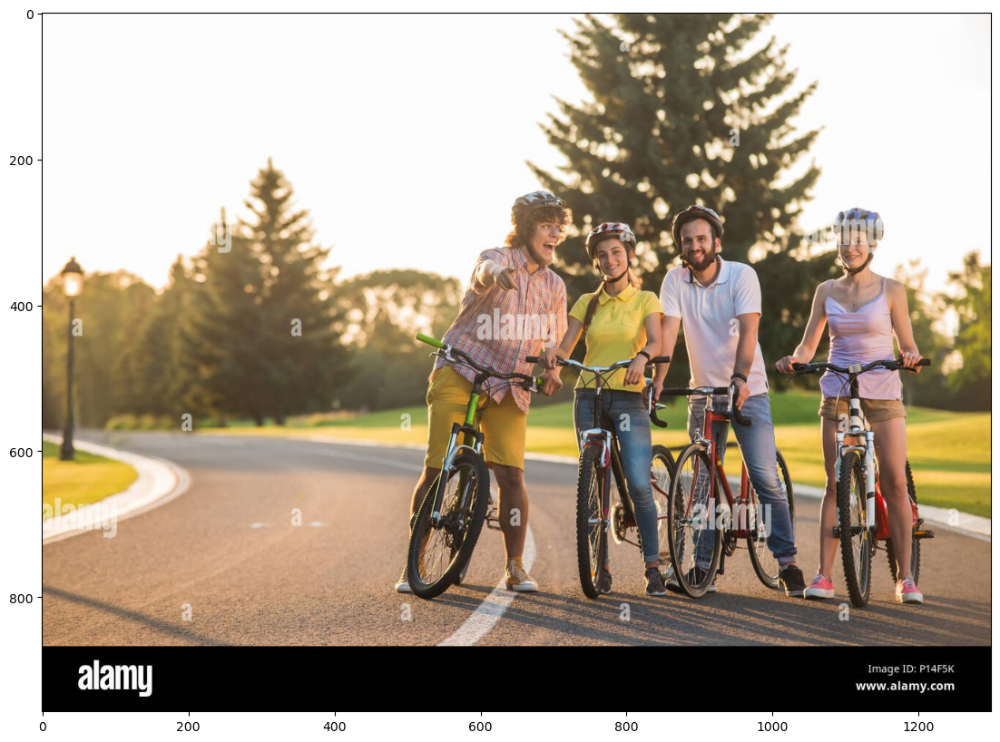

In [147]:
img_path='object 1.jpeg'
half = 0.5
image = Image.open(img_path)

image.resize([int(half * s) for s in image.size] )
plt.figure(figsize=(15, 10))
plt.imshow(image)
plt.show()

<p>We will create a transform object to convert the image to a tensor.</p>


In [148]:
from torchvision import transforms

In [149]:
transform = transforms.Compose([transforms.ToTensor()])

In [150]:
img = transform(image)

<p>Let's print out our image:</p>

In [151]:
img

tensor([[[0.9922, 0.9922, 0.9922,  ..., 0.9569, 0.9569, 0.9569],
         [0.9922, 0.9922, 0.9922,  ..., 0.9569, 0.9569, 0.9569],
         [0.9922, 0.9922, 0.9922,  ..., 0.9569, 0.9569, 0.9569],
         ...,
         [0.0039, 0.0039, 0.0039,  ..., 0.0039, 0.0039, 0.0039],
         [0.0039, 0.0039, 0.0039,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.9922, 0.9922, 0.9922,  ..., 0.9529, 0.9529, 0.9529],
         [0.9922, 0.9922, 0.9922,  ..., 0.9529, 0.9529, 0.9529],
         [0.9922, 0.9922, 0.9922,  ..., 0.9529, 0.9529, 0.9529],
         ...,
         [0.0039, 0.0039, 0.0039,  ..., 0.0039, 0.0039, 0.0039],
         [0.0039, 0.0039, 0.0039,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.9922, 0.9922, 0.9922,  ..., 0.9451, 0.9451, 0.9451],
         [0.9922, 0.9922, 0.9922,  ..., 0.9451, 0.9451, 0.9451],
         [0.9922, 0.9922, 0.9922,  ..., 0.9451, 0.9451, 0.

<p>We can make a prediction,The output is a dictionary with several predicted classes, the probability of belonging to that class and the coordinates of the bounding box corresponding to that class.</p>


In [152]:
import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision import transforms

In [153]:
transform = transforms.Compose([
    transforms.Resize((800, 800)),  # Adjust the size as needed
    transforms.ToTensor(),
    # Add more transformations if needed
])

In [154]:
pred = model([img])

<p><b>note</b>:  if you call <code>model\_(\[img])</code>  directly but it will use more RAM</p>


In [155]:
len(pred[0]['labels'])

38

we have the 2  different class predictions, ordered by likelihood scores for potential objects.


In [156]:
pred[0]['labels']

tensor([ 1,  1,  1,  1,  2,  2,  2,  2,  2, 41,  1, 43, 27, 40,  1,  2, 38,  2,
        13, 31,  1, 39,  2,  2, 27, 43,  2, 39, 31, 77, 16, 10, 28,  1,  2,  2,
         2, 41])

We have the likelihood of each class:


In [157]:
pred[0]['scores']

tensor([0.9994, 0.9992, 0.9989, 0.9982, 0.9861, 0.9467, 0.8409, 0.7684, 0.7159,
        0.6360, 0.4973, 0.4153, 0.3953, 0.3290, 0.2940, 0.2621, 0.2590, 0.2528,
        0.2512, 0.2158, 0.1385, 0.1295, 0.1073, 0.1046, 0.1036, 0.0952, 0.0932,
        0.0927, 0.0906, 0.0889, 0.0725, 0.0671, 0.0661, 0.0582, 0.0565, 0.0546,
        0.0530, 0.0502])

<p>The class number corresponds to the index of the list with the corresponding  category name.</p>


In [158]:
index=pred[0]['labels'][0].item()
COCO_INSTANCE_CATEGORY_NAMES[index]

'person'

<p>We have the coordinates of the bounding box.</p>


In [159]:
bounding_box=pred[0]['boxes'][0].tolist()
bounding_box

[1016.6707153320312, 271.1101379394531, 1214.8023681640625, 803.988525390625]

<p>These components correspond to the top-left corner and bottom-right corner of the rectangle, more precisely: <b>top(t), left(l), bottom(b), right(r).</b></p>

<p>We need to round them, otherwise we can't show it on picure.</p>

In [160]:
t, l, r, b = [round(x) for x in bounding_box]
print(t, l, r, b)

1017 271 1215 804


We convert the tensor to an OpenCV array and plot an image with the box:


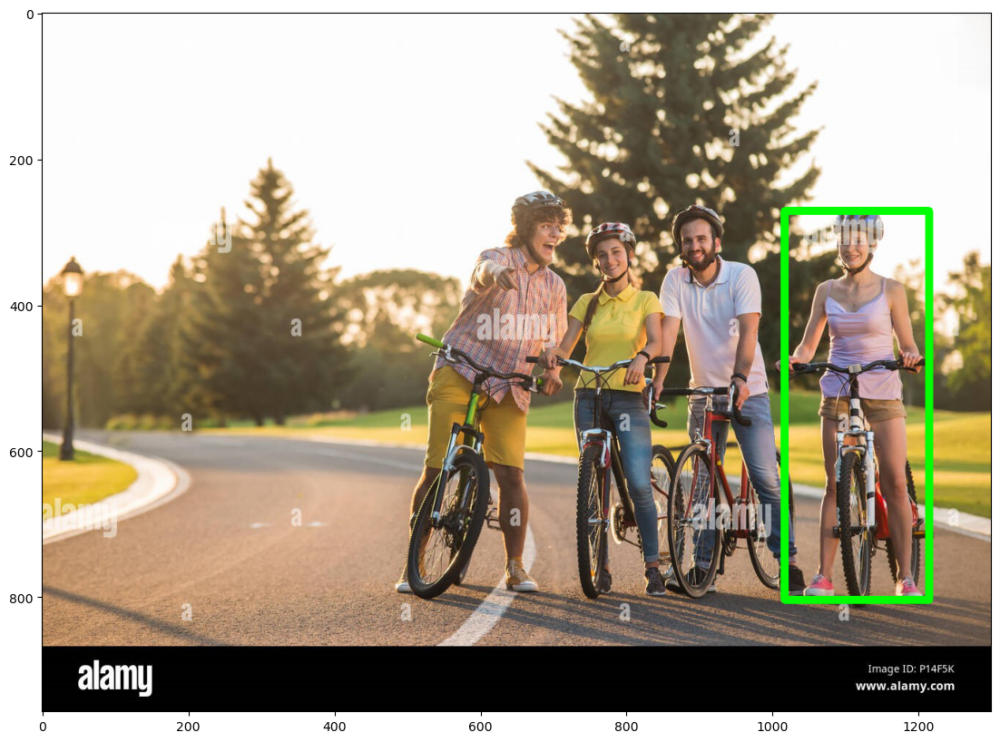

In [161]:
img_plot=(np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8)
cv2.rectangle(img_plot, (t, l), (r, b), (0, 255, 0), 10) # Draw Rectangle with the coordinates
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB))
plt.show()
del img_plot, t, l, r, b

We can localize objects; we do this using the function <code>get_predictions</code>. The input  is the predictions <code>pred</code> and the <code>objects</code> you would like to localize.

<b>Loss equasion:</b>

$$||box\ - \hat{box}||^2 = (y_{min} - \hat{y_{min}})^2 + (y_{max} - \hat{y_{max}})^2 + (x_{min} - \hat{x_{min}})^2 + (x_{max} - \hat{x_{max}})^2$$

<br>


Label: person
Box coordinates: 1017, 271, 1215, 804
Probability: 0.9993649125099182

Label: person
Box coordinates: 690, 283, 861, 795
Probability: 0.9991911053657532

Label: person
Box coordinates: 499, 245, 718, 810
Probability: 0.9988970756530762

Label: person
Box coordinates: 835, 267, 1043, 803
Probability: 0.9982055425643921


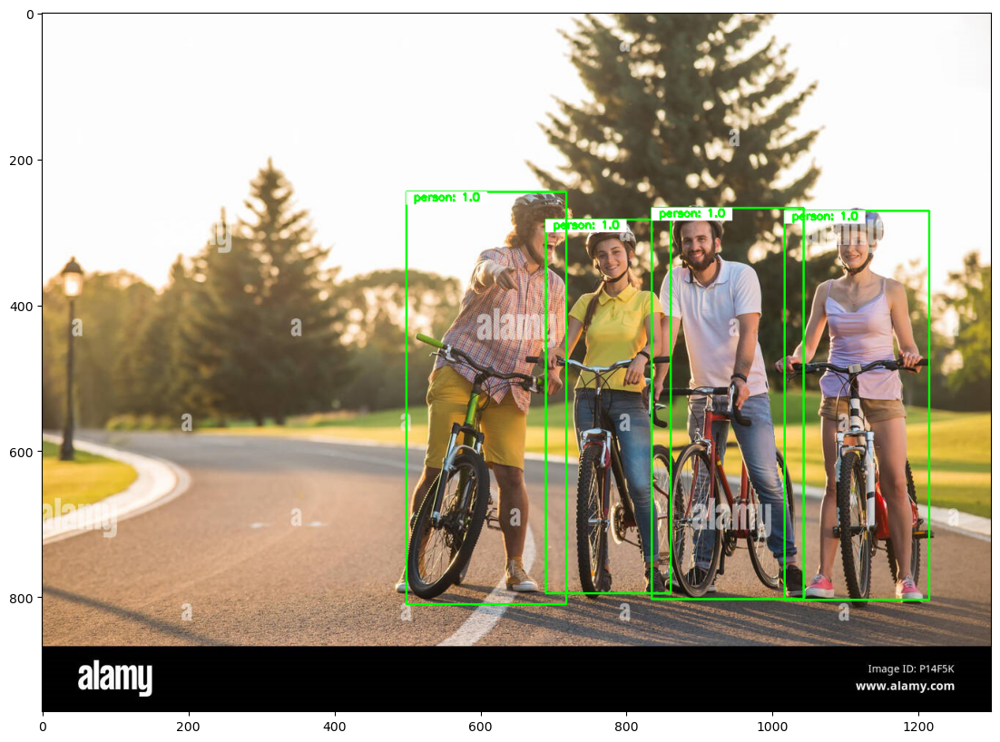

In [162]:
pred_class=get_predictions(pred, objects="person")
draw_box(pred_class, img)

del pred_class

We can set a threshold <code>threshold</code>. Here we set the  threshold 1 i.e Here we set the  threshold 1 i.e. 100% likelihood.


In [163]:
get_predictions(pred, threshold=1, objects="person")

[]

Here we have no output as the likelihood is not 100%.  Let's try a threshold of 0.98 and use the function  draw_box to draw the box and plot the class and it's rounded likelihood.



Label: person
Box coordinates: 1017, 271, 1215, 804
Probability: 0.9993649125099182

Label: person
Box coordinates: 690, 283, 861, 795
Probability: 0.9991911053657532

Label: person
Box coordinates: 499, 245, 718, 810
Probability: 0.9988970756530762

Label: person
Box coordinates: 835, 267, 1043, 803
Probability: 0.9982055425643921


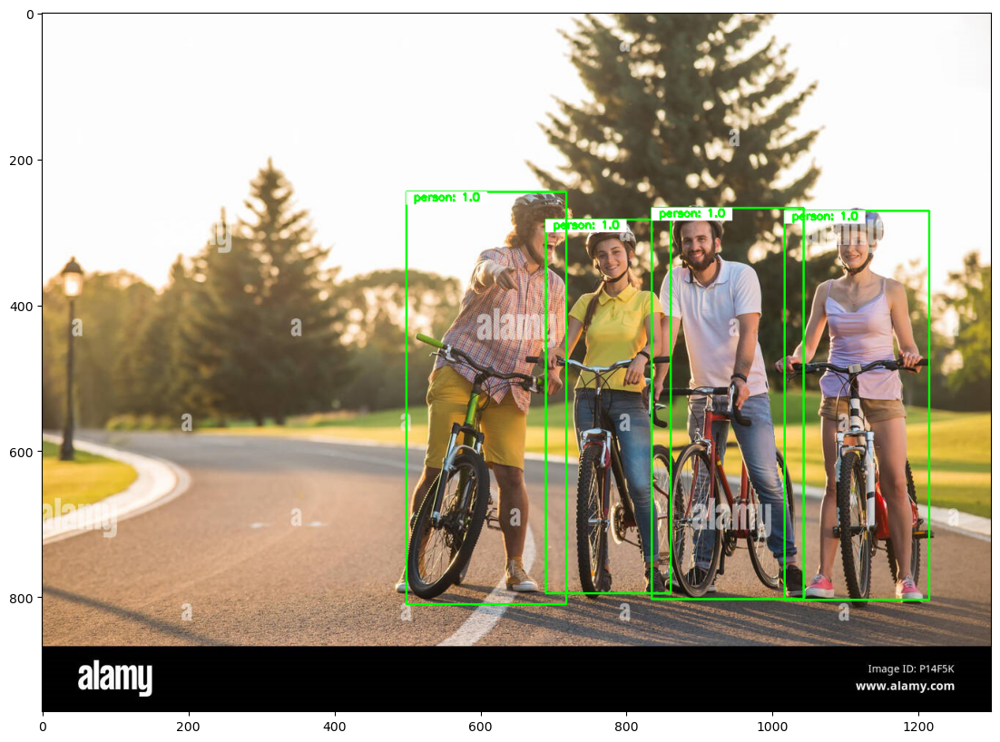

In [164]:
pred_thresh=get_predictions(pred, threshold=0.98, objects="person")
draw_box(pred_thresh, img, download_image=True, img_name="andrew_BOX")
del pred_thresh

Delete objects to save memory, we will run this after every cell:


In [165]:
save_RAM(image_=True)

We can locate multiple objects, consider the following <a href='https://www.kdnuggets.com/2015/03/talking-machine-deep-learning-gurus-p1.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01'>image</a>, we can detect the people in the image.


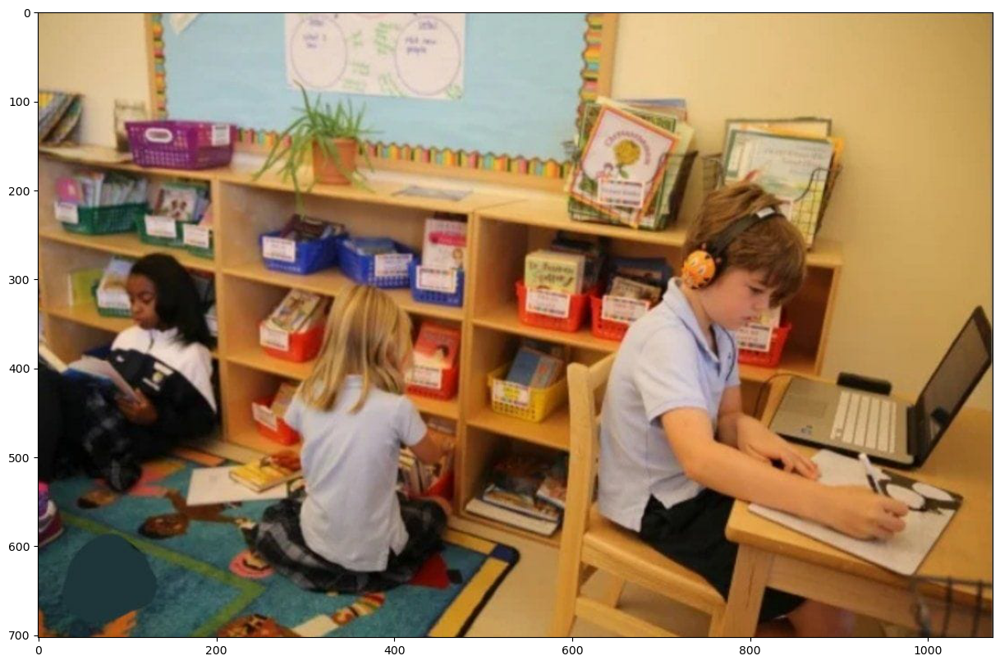

In [166]:
img_path='student.jpeg'
image = Image.open(img_path)
image.resize([int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()

we can set a threshold to detect the object, 0.9 seems to work.



Label: laptop
Box coordinates: 600, 387, 800, 582
Probability: 0.9974907636642456

Label: person
Box coordinates: 465, 240, 736, 760
Probability: 0.9888244271278381

Label: book
Box coordinates: 1, 104, 37, 170
Probability: 0.9581326842308044

Label: person
Box coordinates: 11, 315, 155, 617
Probability: 0.9536283612251282

Label: potted plant
Box coordinates: 188, 101, 290, 228
Probability: 0.9467774033546448

Label: person
Box coordinates: 178, 364, 341, 728
Probability: 0.9435294270515442

Label: book
Box coordinates: 565, 142, 673, 302
Probability: 0.8552302718162537


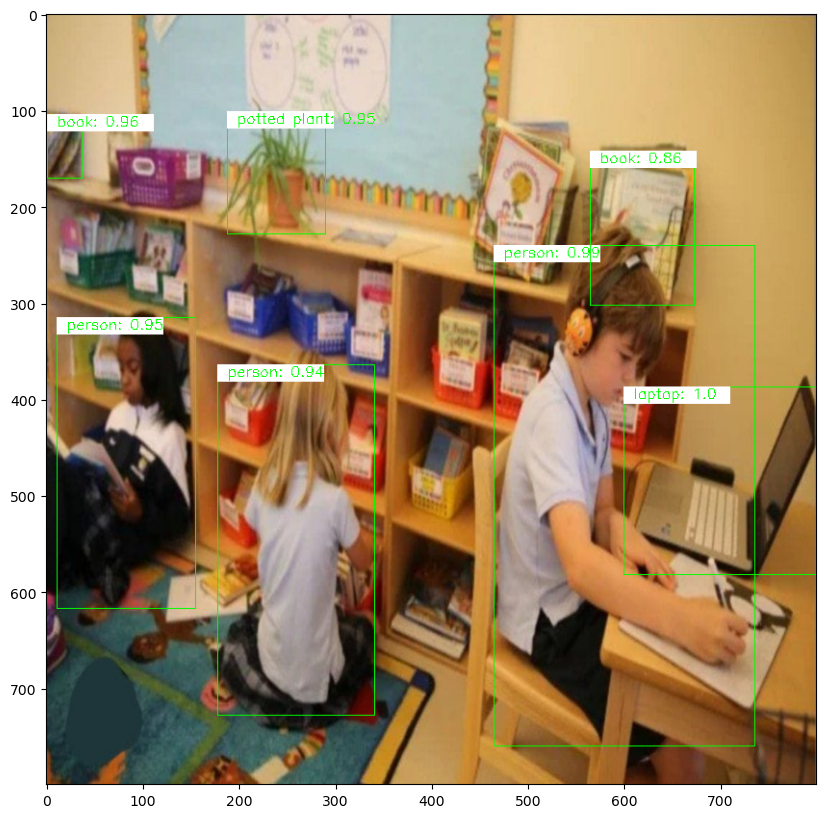

In [167]:
img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.8)
draw_box(pred_thresh, img, rect_th=1, text_size= 0.5, text_th=1)

del pred_thresh

Or we can use objects parameter:



Label: person
Box coordinates: 465, 240, 736, 760
Probability: 0.9888244271278381

Label: person
Box coordinates: 11, 315, 155, 617
Probability: 0.9536283612251282

Label: person
Box coordinates: 178, 364, 341, 728
Probability: 0.9435294270515442


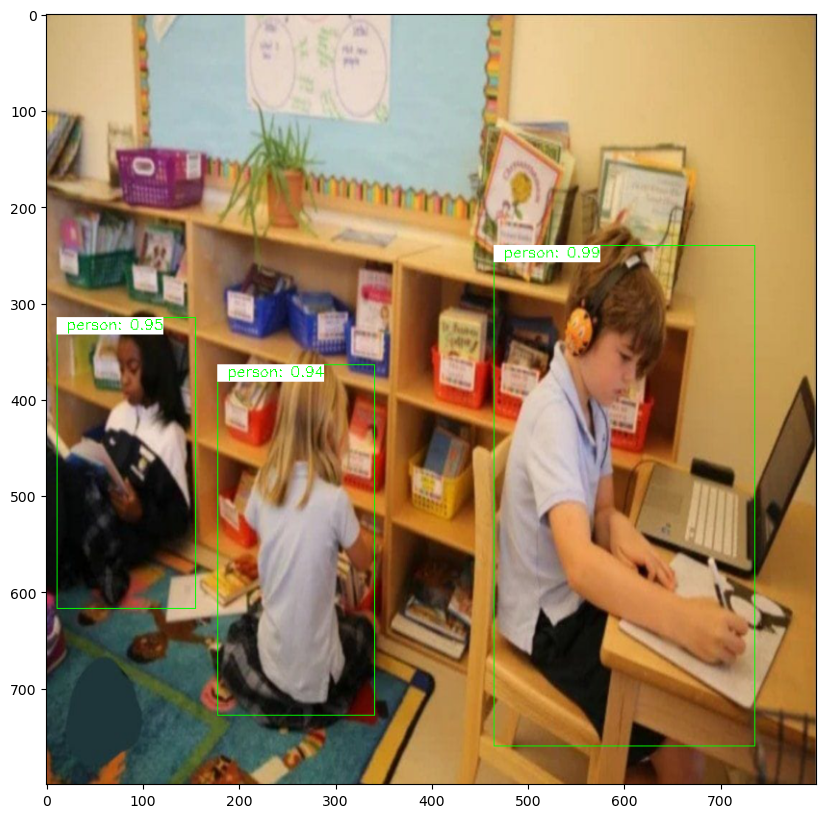

In [168]:
pred_obj=get_predictions(pred,objects="person")
draw_box(pred_obj, img, rect_th=1,text_size= 0.5, text_th=1, download_image=True, img_name="dl_guys_IBM_BOX")

del pred_obj

If we set the threshold too low, we will detect objects that are not there.



Label: laptop
Box coordinates: 600, 387, 800, 582
Probability: 0.9974907636642456

Label: person
Box coordinates: 465, 240, 736, 760
Probability: 0.9888244271278381

Label: book
Box coordinates: 1, 104, 37, 170
Probability: 0.9581326842308044

Label: person
Box coordinates: 11, 315, 155, 617
Probability: 0.9536283612251282

Label: potted plant
Box coordinates: 188, 101, 290, 228
Probability: 0.9467774033546448

Label: person
Box coordinates: 178, 364, 341, 728
Probability: 0.9435294270515442

Label: book
Box coordinates: 565, 142, 673, 302
Probability: 0.8552302718162537

Label: chair
Box coordinates: 428, 449, 586, 794
Probability: 0.7956967949867249

Label: book
Box coordinates: 309, 393, 356, 499
Probability: 0.7753281593322754

Label: book
Box coordinates: 403, 300, 467, 410
Probability: 0.7666283249855042

Label: book
Box coordinates: 0, 104, 25, 154
Probability: 0.7327449321746826

Label: book
Box coordinates: 442, 111, 547, 272
Probability: 0.6837088465690613

Label: book
Box c

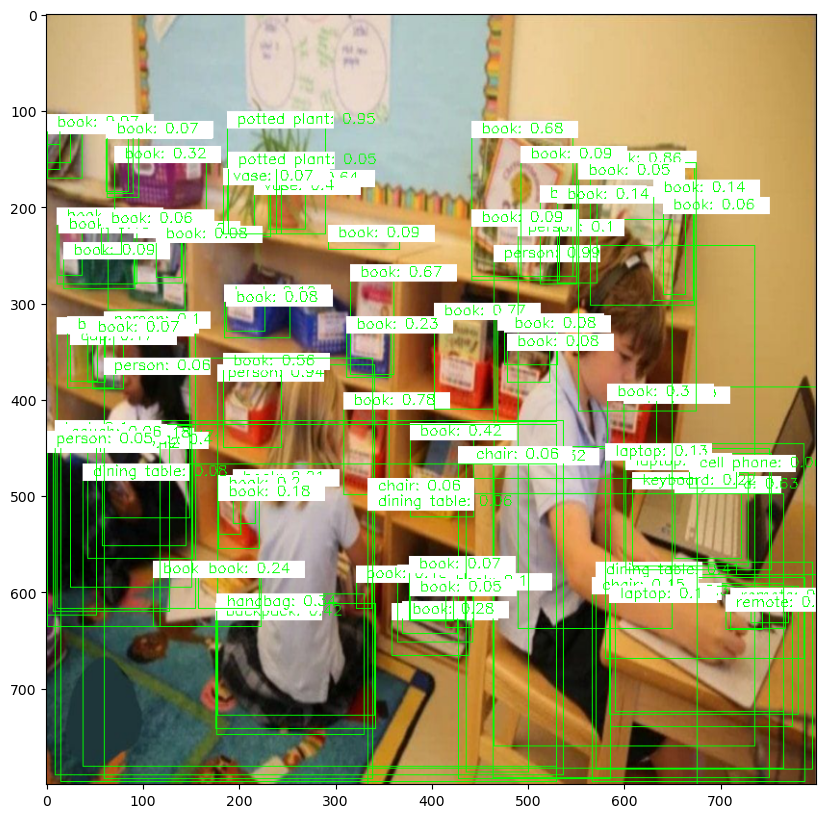

In [169]:
pred_thresh=get_predictions(pred,threshold=0.01)
draw_box(pred_thresh, img, rect_th= 1, text_size=0.5, text_th=1)

del pred_thresh

the following lines will speed up your code by using less RAM.


In [170]:
save_RAM(image_=True)

<br>

<a id="object_detection"></a>

<h2 align=center>Object Detection</h2>

In Object Detection we find the classes as well detect the objects in an image. Consider the following <a href="https://www.dreamstime.com/stock-image-golden-retriever-puppy-lying-parakeet-perched-its-head-weeks-old-next-to-british-shorthair-kitten-sitting-image30336051?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01">image</a>


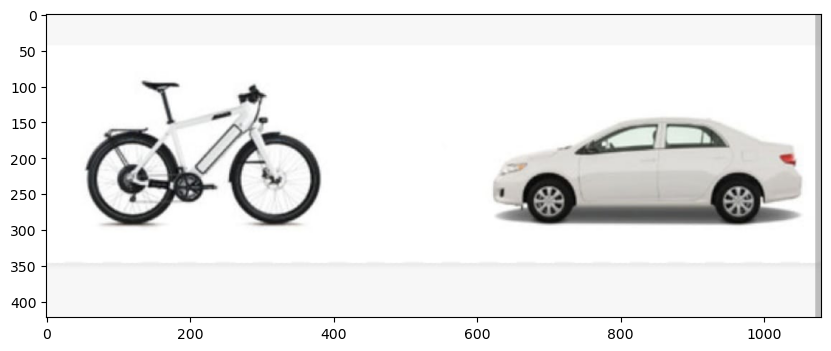

In [179]:
img_path='object 3.jpeg'
image = Image.open(img_path)
image.resize( [int(half * s) for s in image.size])
plt.figure(figsize=(10, 6))
plt.imshow(np.array(image))
plt.show()
del img_path

If we set a threshold, we can detect all objects whose likelihood is above that threshold.



Label: car
Box coordinates: 462, 279, 774, 550
Probability: 0.9971981048583984

Label: bicycle
Box coordinates: 37, 173, 288, 566
Probability: 0.9970058798789978


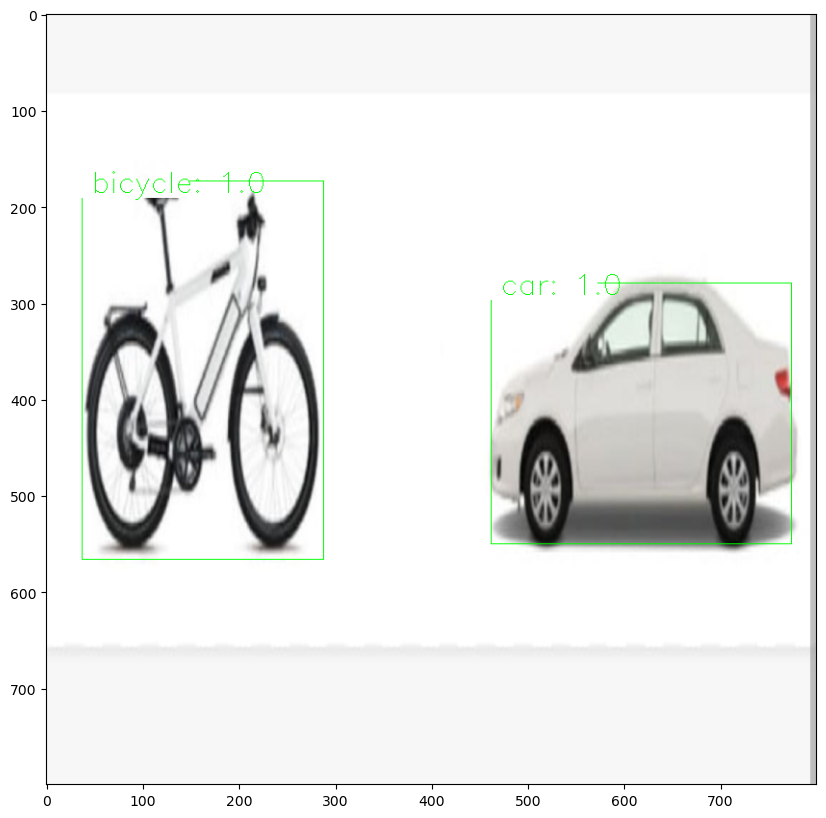

In [181]:
img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred,threshold=0.97)
draw_box(pred_thresh,img,rect_th=1, text_size=1, text_th=1, download_image=True, img_name="dog_cat_bird_BOX")

del pred_thresh

We can specify the objects we would like to classify, for example, cats and dogs:


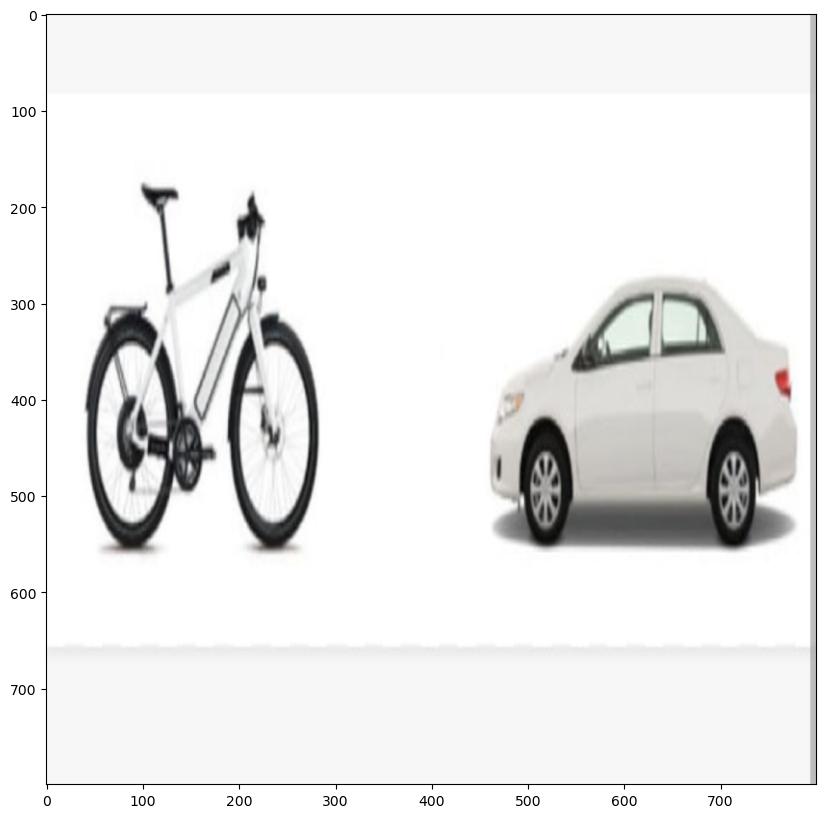

In [182]:
# img = transform(image)
# pred = model([img])
pred_obj=get_predictions(pred, objects=["dog","cat"])
draw_box(pred_obj, img,rect_th=1, text_size= 0.5, text_th=1)
del pred_obj

If we set the threshold too low, we may detect objects with a low likelihood of being correct; here, we set the threshold to 0.7, and we incorrectly  detect a cat


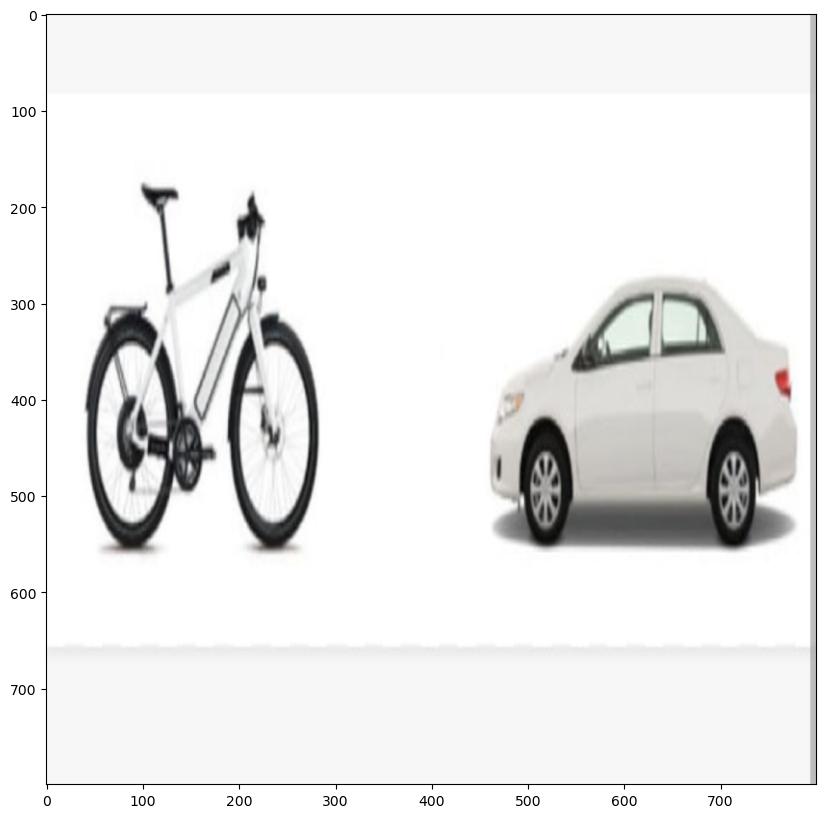

In [183]:
# img = transform(image)
# pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.70, objects=["dog", "cat"])
draw_box(pred_thresh, img, rect_th= 1, text_size=1, text_th=1)

del pred_thresh

In [184]:
save_RAM(image_=True)

We can detect other objects. Consider the following <a href='https://www.flickr.com/photos/watts_photos/27581126637?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01'>image</a>; We can detect cars and airplanes


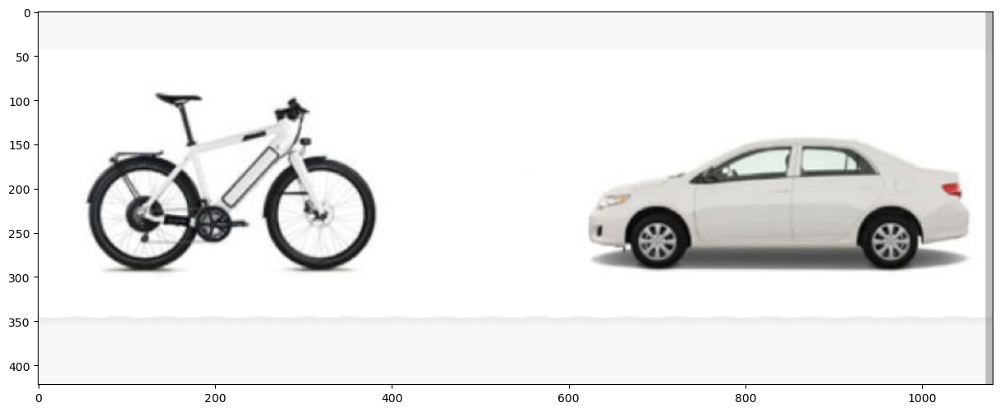

In [186]:
img_path='object 3.jpeg'
image = Image.open(img_path)
image.resize( [int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()
del img_path


Label: car
Box coordinates: 462, 279, 774, 550
Probability: 0.9971981048583984

Label: bicycle
Box coordinates: 37, 173, 288, 566
Probability: 0.9970058798789978


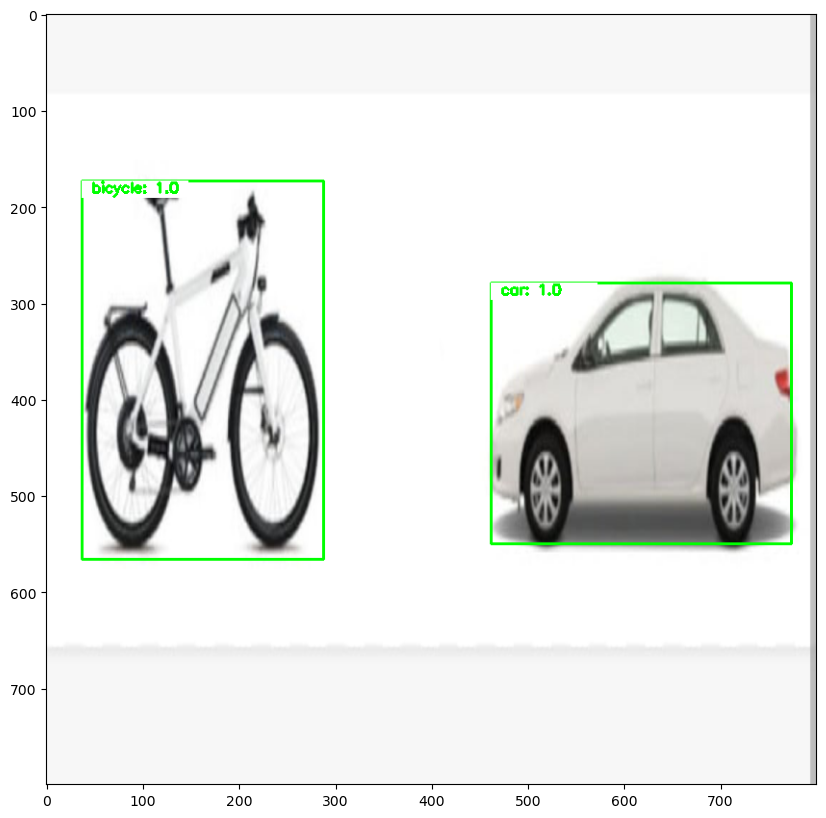

In [187]:
img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.997)
draw_box(pred_thresh, img, download_image=True, img_name="car_bicycle_BOX")
del pred_thresh

In [188]:
save_RAM(image_=True)

<br>

<a id="test_model_uploaded"></a>

<h2 align=center>Test Model With an Uploaded Image</h2>

Replace with the name of your image as seen in your directory into <code>img_path</code> variable.


In [189]:
from pathlib import Path
print("Directory Path:", Path().absolute())

Directory Path: C:\Users\Samanta Patil\OneDrive\Deep Learning with Python


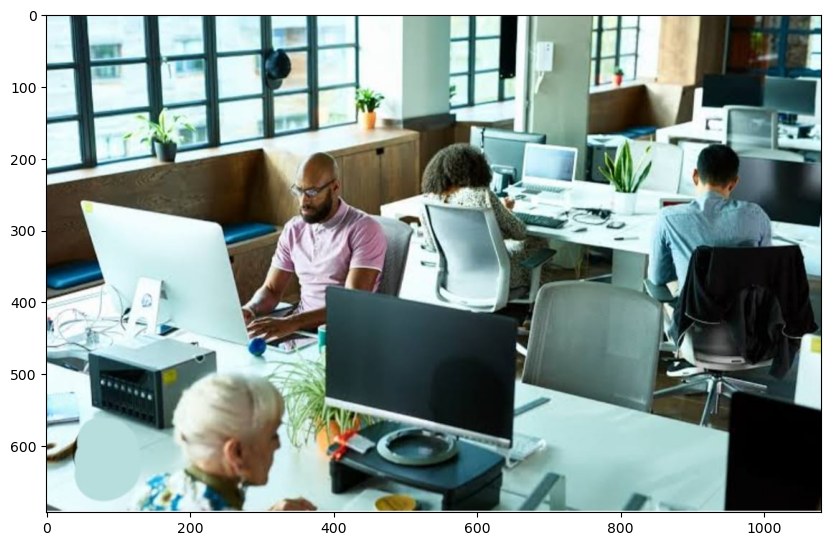

In [193]:
img_path = 'object 5.jpeg'
image = Image.open(img_path)
plt.figure(figsize=(10, 15))
plt.imshow(np.array(image))
plt.show()


Label: person
Box coordinates: 195, 221, 363, 545
Probability: 0.99357008934021

Label: person
Box coordinates: 85, 575, 248, 790
Probability: 0.984166145324707

Label: person
Box coordinates: 617, 214, 752, 481
Probability: 0.9832665920257568

Label: potted plant
Box coordinates: 84, 152, 155, 240
Probability: 0.9821027517318726

Label: potted plant
Box coordinates: 318, 118, 351, 185
Probability: 0.9690791368484497

Label: person
Box coordinates: 354, 211, 511, 460
Probability: 0.9610146880149841

Label: chair
Box coordinates: 383, 301, 489, 484
Probability: 0.955073893070221

Label: tv
Box coordinates: 490, 207, 548, 281
Probability: 0.9508597254753113


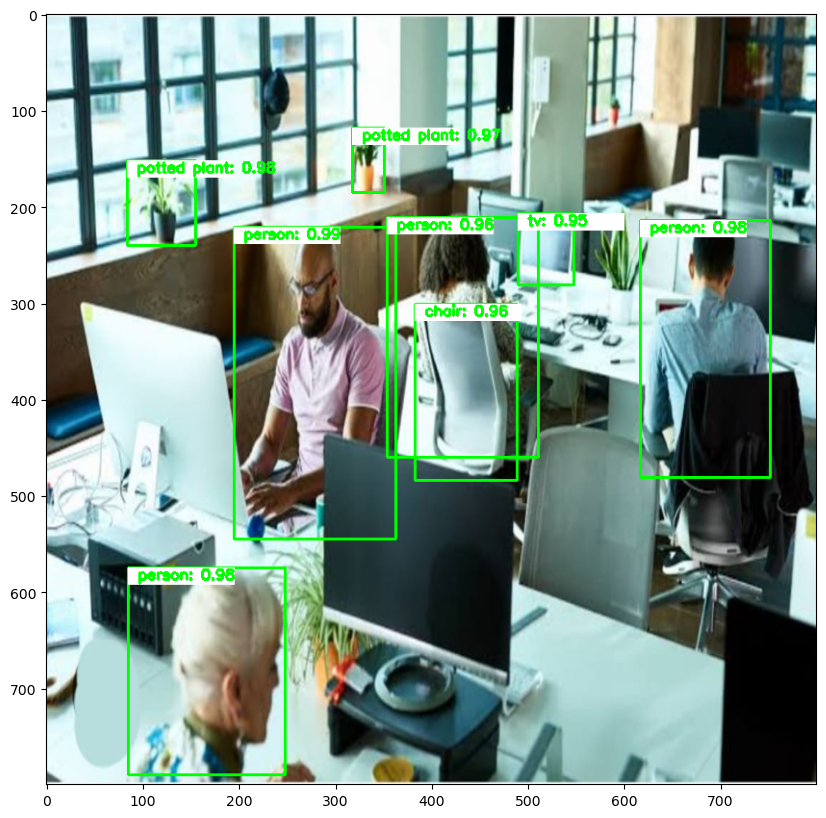

In [195]:
img = transform(image )
pred = model(img.unsqueeze(0))
pred_thresh=get_predictions(pred,threshold=0.95)
draw_box(pred_thresh, img, download_image=True, img_name="me_tv")

# Bidirectional

In [196]:
from IPython.display import Image
%matplotlib inline

In [197]:
from random import random
from numpy import array
from numpy import cumsum
def get_sequence(n_timesteps):
 
 x=array([random() for _ in range(n_timesteps)])
 limit=n_timesteps/4.0
 y=array([0 if x<limit else 1 for x in cumsum(x)])
 
 return x,y
x,y=get_sequence(10)
print('Input Sequence-x:\n',x)
print()
print('Output-y:\n',y)

Input Sequence-x:
 [0.42027415 0.06592621 0.26150393 0.26067904 0.06996031 0.356819
 0.71134022 0.06054996 0.27961937 0.28558705]

Output-y:
 [0 0 0 0 0 0 0 0 0 1]


In [198]:
#Generate Multiple Sequences
def get_sequences(n_sequences,n_timesteps):
    seq_x,seq_y=list(),list()
 
    for _ in range(n_sequences):
        x,y=get_sequence(n_timesteps)
        seq_x.append(x)
        seq_y.append(y)
 
    seq_x=array(seq_x).reshape(n_sequences,n_timesteps,1)
    seq_y=array(seq_y).reshape(n_sequences,n_timesteps,1)
    return seq_x,seq_y 

In [199]:
get_sequences(2,10)

(array([[[0.97749081],
         [0.90610194],
         [0.54738701],
         [0.3742169 ],
         [0.54179056],
         [0.54040204],
         [0.87284296],
         [0.37028766],
         [0.18110268],
         [0.25999332]],
 
        [[0.62731139],
         [0.32441032],
         [0.10866313],
         [0.10543042],
         [0.34625658],
         [0.94179463],
         [0.60895729],
         [0.04136524],
         [0.94975223],
         [0.33297697]]]),
 array([[[0],
         [0],
         [0],
         [1],
         [1],
         [1],
         [1],
         [1],
         [1],
         [1]],
 
        [[0],
         [0],
         [0],
         [0],
         [0],
         [0],
         [1],
         [1],
         [1],
         [1]]]))

In [200]:
n_timesteps=10

Build a Bidirectional model


In [202]:
from keras.models import Sequential
from keras.layers import Bidirectional
from keras.layers import TimeDistributed
from keras.layers import Dense,LSTM
model=Sequential()
#bidirectional layer
model.add(Bidirectional(LSTM(50,return_sequences=True),input_shape=(n_timesteps,1)))
#Output layer - time distributed layer
model.add(TimeDistributed(Dense(1,activation='sigmoid')))
#compile the model
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
print(model.summary())


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_1 (Bidirecti  (None, 10, 100)           20800     
 onal)                                                           
                                                                 
 time_distributed_1 (TimeDi  (None, 10, 1)             101       
 stributed)                                                      
                                                                 
Total params: 20901 (81.64 KB)
Trainable params: 20901 (81.64 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [204]:
#train the model
x,y=get_sequences(50000,n_timesteps)

model.fit(x,y,epochs=5,batch_size=10)


Epoch 1/5
5000/5000 [==============================] - 17s 3ms/step - loss: 0.0245 - accuracy: 0.9918
Epoch 2/5
5000/5000 [==============================] - 18s 4ms/step - loss: 0.0176 - accuracy: 0.9937
Epoch 3/5
5000/5000 [==============================] - 30s 6ms/step - loss: 0.0153 - accuracy: 0.9943
Epoch 4/5
5000/5000 [==============================] - 27s 5ms/step - loss: 0.0136 - accuracy: 0.9949
Epoch 5/5
5000/5000 [==============================] - 19s 4ms/step - loss: 0.0125 - accuracy: 0.9952


In [205]:
#Evaluate the model
x,y=get_sequences(100,n_timesteps)
loss,acc=model.evaluate(x,y,verbose=1)
print()
print('Loss: %f, Accuracy: %f'%(loss,acc*100))

4/4 [==============================] - 1s 3ms/step - loss: 0.0122 - accuracy: 0.9960

Loss: 0.012174, Accuracy: 99.599999


In [206]:
# Make prediction
import numpy as np
for _ in range(10):
    x,y=get_sequences(1,n_timesteps)
    yhat=model.predict(x,verbose=0)
    exp,pred=y.reshape(n_timesteps),yhat.reshape(n_timesteps)
 
    print('y=%s, yhat=%s,correct=%s' % (exp,pred,np.array_equal(exp,pred)))


y=[0 0 0 0 0 1 1 1 1 1], yhat=[1.3093358e-15 9.5358450e-16 2.1559131e-13 8.4951435e-14 7.1051778e-05
 2.4642457e-01 1.0000000e+00 1.0000000e+00 1.0000000e+00 1.0000000e+00],correct=False
y=[0 0 0 0 1 1 1 1 1 1], yhat=[1.3377092e-15 2.4774234e-15 8.3648699e-11 3.6165986e-06 9.9977475e-01
 9.9997437e-01 1.0000000e+00 1.0000000e+00 1.0000000e+00 1.0000000e+00],correct=False
y=[0 0 0 0 0 1 1 1 1 1], yhat=[3.1376591e-14 3.9087775e-14 1.0776954e-12 4.9864175e-06 1.2446925e-05
 9.9976408e-01 9.9997437e-01 1.0000000e+00 1.0000000e+00 1.0000000e+00],correct=False
y=[0 0 0 0 0 1 1 1 1 1], yhat=[4.9080359e-15 5.8701844e-15 1.5145694e-14 3.3760789e-11 4.4767153e-03
 9.9999958e-01 1.0000000e+00 1.0000000e+00 1.0000000e+00 1.0000000e+00],correct=False
y=[0 0 0 0 0 0 1 1 1 1], yhat=[7.0621004e-15 5.1262713e-11 1.4407434e-13 3.8991082e-05 3.8881917e-05
 1.2114706e-02 1.0000000e+00 1.0000000e+00 1.0000000e+00 1.0000000e+00],correct=False
y=[0 0 0 1 1 1 1 1 1 1], yhat=[5.9604099e-11 4.6962149e-11 1.2458

In [207]:
#train the model
x,y=get_sequences(50000,n_timesteps)
model.fit(x,y,epochs=1,batch_size=10)

5000/5000 [==============================] - 20s 4ms/step - loss: 0.0122 - accuracy: 0.9952


In [208]:
# Make prediction
import numpy as np
for _ in range(10):
    x,y=get_sequences(1,n_timesteps)
    ypred=model.predict(x,verbose=0)
    actual,pred=y.reshape(n_timesteps),ypred.reshape(n_timesteps)
 
    print('y=%s, ypred=%s,correct=%s' % (actual,pred,np.array_equal(actual,ypred)))


y=[0 0 0 0 0 1 1 1 1 1], ypred=[4.8630190e-11 5.1187990e-14 4.5286583e-15 2.1894012e-12 4.2928342e-08
 9.9998289e-01 1.0000000e+00 1.0000000e+00 1.0000000e+00 1.0000000e+00],correct=False
y=[0 0 0 0 0 1 1 1 1 1], ypred=[2.1788428e-14 8.4073960e-16 2.6168354e-11 1.9142783e-13 8.8877305e-02
 1.0000000e+00 1.0000000e+00 1.0000000e+00 1.0000000e+00 1.0000000e+00],correct=False
y=[0 0 0 0 1 1 1 1 1 1], ypred=[8.2463751e-11 8.1184105e-13 1.2421988e-05 4.1981108e-05 9.8672372e-01
 1.0000000e+00 1.0000000e+00 1.0000000e+00 1.0000000e+00 1.0000000e+00],correct=False
y=[0 0 0 0 1 1 1 1 1 1], ypred=[3.7769013e-14 1.1528937e-11 1.5108916e-13 5.3555841e-13 6.6540664e-01
 9.9999994e-01 1.0000000e+00 1.0000000e+00 1.0000000e+00 1.0000000e+00],correct=False
y=[0 0 0 0 0 0 0 1 1 1], ypred=[1.3051978e-13 1.3902607e-14 1.7149288e-15 8.0560203e-12 3.5673057e-07
 8.5293286e-05 2.7176702e-01 1.0000000e+00 1.0000000e+00 1.0000000e+00],correct=False
y=[0 0 0 0 0 0 0 1 1 1], ypred=[1.8127802e-12 2.3059436e-10 